STEP-1: Install dependencies & download video

In [2]:
!pip install mediapipe yt-dlp opencv-python --quiet

# Download sample javelin video ✅
!yt-dlp -f best -o javelin.mp4 "https://youtu.be/TFFr0jwln2o?si=ySa_VKhHTz7YvWk9"


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 176.0/176.0 kB 3.2 MB/s eta 0:00:0000:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 35.6/35.6 MB 38.2 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.2/3.2 MB 59.7 MB/s eta 0:00:00:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.0/63.0 MB 21.8 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.9/294.9 kB 11.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 69.1/69.1 MB 19.9 MB/s eta 0:00:00:00:0100:01
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
bigframes 2.12.0 requires google-cloud-bigquery-storage<3.0.0,>=2.30.0, which is not installed.
google-api-core 1.34.1 requires protobuf!=3.20.0,!=3.20.1,!=4.21.0,!=4.21.1,!=4.21.2,!=4.21.3,!=4.21.4,!=4.21.5,<4.0.0dev,>=3.19.5, but you have protobuf 4.25.8 which is incompatible.
google-cloud-bigtable 2.3

STEP-2: Run Pose Estimation Frame-by-Frame

In [4]:
import cv2
import mediapipe as mp
import numpy as np
import math

mp_pose = mp.solutions.pose
pose = mp_pose.Pose()

cap = cv2.VideoCapture("javelin.mp4")

angles = []

def calc_angle(a, b, c):
    a = np.array(a)
    b = np.array(b)
    c = np.array(c)
    
    ba = a - b
    bc = c - b
    
    cosine = np.dot(ba, bc) / (np.linalg.norm(ba) * np.linalg.norm(bc))
    return np.degrees(np.arccos(np.clip(cosine, -1.0, 1.0)))

while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    results = pose.process(rgb)
    
    if results.pose_landmarks:
        landmarks = results.pose_landmarks.landmark
        
        hip = (landmarks[mp_pose.PoseLandmark.RIGHT_HIP].x,
               landmarks[mp_pose.PoseLandmark.RIGHT_HIP].y)
        knee = (landmarks[mp_pose.PoseLandmark.RIGHT_KNEE].x,
                landmarks[mp_pose.PoseLandmark.RIGHT_KNEE].y)
        ankle = (landmarks[mp_pose.PoseLandmark.RIGHT_ANKLE].x,
                 landmarks[mp_pose.PoseLandmark.RIGHT_ANKLE].y)

        angle = calc_angle(hip, knee, ankle)
        angles.append(angle)

cap.release()
pose.close()


W0000 00:00:1761984525.184313     142 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1761984525.262031     142 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


STEP-3: Plot the Knee Joint Angle Graph

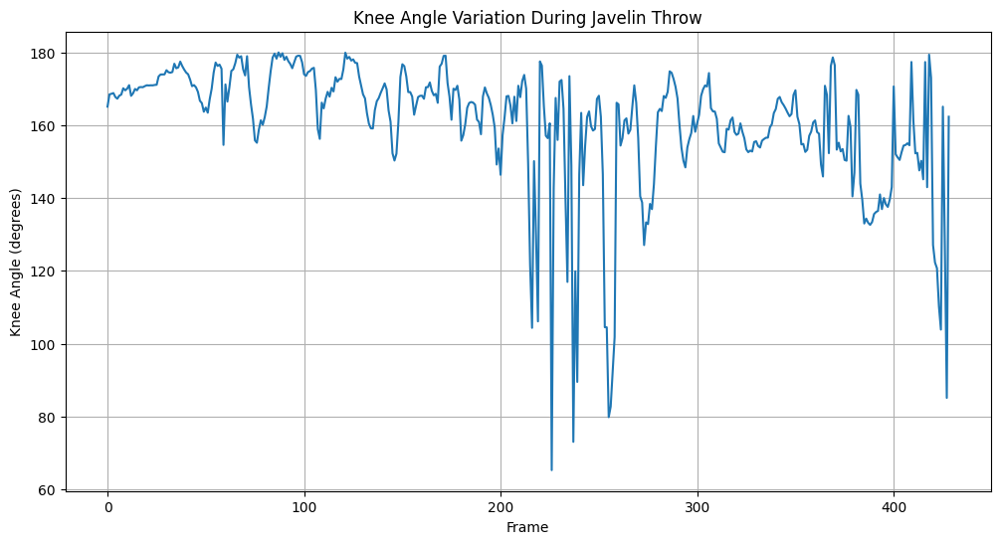

In [5]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12,6))
plt.plot(angles)
plt.title("Knee Angle Variation During Javelin Throw")
plt.xlabel("Frame")
plt.ylabel("Knee Angle (degrees)")
plt.grid(True)
plt.show()


In [7]:
"""
Kaggle-ready MediaPipe gait & lower-body analysis
Outputs:
 - results/angles_and_keypoints.csv
 - results/strides.csv
 - results/summary_metrics.csv
 - results/plots/*.png
 - results/annotated_video.mp4
"""

import os, math, csv, sys
from pathlib import Path
import cv2
import mediapipe as mp
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.signal import savgol_filter, find_peaks

# ----------------- USER PARAMETERS -----------------
VIDEO_PATH = "javelin.mp4"       # or your uploaded file path in Kaggle datasets
OUTPUT_DIR = "results"
KNOWN_HEIGHT_M = 1.85            # set athlete height in meters if you want pixel-to-meter calibration
PIXELS_PER_METER = None          # if you already know scale, set here (overrides KNOWN_HEIGHT_M)
SMOOTH_WINDOW = 11               # must be odd for Savitzky-Golay
FPS_OVERRIDE = None              # set if you want to override detection from video
# ---------------------------------------------------

os.makedirs(OUTPUT_DIR, exist_ok=True)
os.makedirs(os.path.join(OUTPUT_DIR, "plots"), exist_ok=True)

# ---------- Helpers ----------
mp_pose = mp.solutions.pose
POSE = mp_pose.Pose(static_image_mode=False, model_complexity=1, enable_segmentation=False, min_detection_confidence=0.5, min_tracking_confidence=0.5)

def calc_angle(a, b, c):
    # Inputs a,b,c are (x,y) normalized coords or pixel coords; returns angle in degrees at b (a-b-c)
    a, b, c = np.array(a), np.array(b), np.array(c)
    ba = a - b
    bc = c - b
    denom = (np.linalg.norm(ba)*np.linalg.norm(bc))
    if denom == 0:
        return np.nan
    cosang = np.dot(ba, bc) / denom
    cosang = np.clip(cosang, -1.0, 1.0)
    return float(np.degrees(np.arccos(cosang)))

def smooth_series(x, window=11, poly=3):
    if len(x) >= window:
        return savgol_filter(x, window, poly)
    else:
        return x

# map MediaPipe landmarks we need
LM = mp_pose.PoseLandmark
LANDMARK_KEYS = {
    'R_HIP': LM.RIGHT_HIP, 'R_KNEE': LM.RIGHT_KNEE, 'R_ANKLE': LM.RIGHT_ANKLE, 'R_FOOT_INDEX': LM.RIGHT_FOOT_INDEX,
    'L_HIP': LM.LEFT_HIP, 'L_KNEE': LM.LEFT_KNEE, 'L_ANKLE': LM.LEFT_ANKLE, 'L_FOOT_INDEX': LM.LEFT_FOOT_INDEX,
    'NOSE': LM.NOSE, 'LEFT_SHOULDER': LM.LEFT_SHOULDER, 'RIGHT_SHOULDER': LM.RIGHT_SHOULDER
}

# ---------- Load video & extract landmarks ----------
cap = cv2.VideoCapture(VIDEO_PATH)
if not cap.isOpened():
    raise RuntimeError(f"Could not open video {VIDEO_PATH}")

fps = FPS_OVERRIDE or cap.get(cv2.CAP_PROP_FPS) or 30.0
frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
duration_s = frame_count / fps
print(f"[INFO] video opened: {VIDEO_PATH} | {frame_count} frames | {fps:.2f} FPS | {width}x{height}")

# storage
frames_landmarks = []   # list of dicts per frame {name: (x_px, y_px, visibility)}
times = []

frame_idx = 0
while True:
    ret, frame = cap.read()
    if not ret:
        break
    time_s = frame_idx / fps
    # use RGB for mediapipe
    rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    res = POSE.process(rgb)
    lm_dict = {}
    if res.pose_landmarks:
        for name, lm_id in LANDMARK_KEYS.items():
            lm = res.pose_landmarks.landmark[lm_id]
            # convert normalized coords to pixels
            x_px = float(lm.x * width)
            y_px = float(lm.y * height)
            lm_dict[name] = (x_px, y_px, float(lm.visibility))
    else:
        # fill nans
        for name in LANDMARK_KEYS.keys():
            lm_dict[name] = (np.nan, np.nan, 0.0)
    frames_landmarks.append(lm_dict)
    times.append(time_s)
    frame_idx += 1

cap.release()
POSE.close()

n_frames = len(frames_landmarks)
print(f"[INFO] extracted landmarks for {n_frames} frames")

# ---------- Convert to arrays for computation ----------
def arr_for_key(key):
    arr = np.full((n_frames, 2), np.nan)
    conf = np.zeros(n_frames)
    for i,kp in enumerate(frames_landmarks):
        x,y,c = kp.get(key, (np.nan, np.nan, 0.0))
        arr[i,0] = x; arr[i,1] = y; conf[i] = c
    return arr, conf

R_ankle_xy, R_conf = arr_for_key('R_ANKLE')
L_ankle_xy, L_conf = arr_for_key('L_ANKLE')
R_knee_xy, _ = arr_for_key('R_KNEE')
L_knee_xy, _ = arr_for_key('L_KNEE')
R_hip_xy, _ = arr_for_key('R_HIP')
L_hip_xy, _ = arr_for_key('L_HIP')
nose_xy, _ = arr_for_key('NOSE')
L_shoulder_xy, _ = arr_for_key('LEFT_SHOULDER')
R_shoulder_xy, _ = arr_for_key('RIGHT_SHOULDER')
R_foot_idx, R_foot_conf = arr_for_key('R_FOOT_INDEX')
L_foot_idx, L_foot_conf = arr_for_key('L_FOOT_INDEX')

# ---------- Smooth ankle traces & fill small gaps ----------
def fill_interp(arr):
    arr_out = arr.copy()
    for col in range(2):
        v = arr[:,col]
        mask = ~np.isnan(v)
        if mask.sum() < 2:
            continue
        arr_out[:,col] = np.interp(np.arange(len(v)), np.where(mask)[0], v[mask])
    return arr_out

R_ankle_xy_f = fill_interp(R_ankle_xy)
L_ankle_xy_f = fill_interp(L_ankle_xy)

# optional smoothing
if n_frames >= SMOOTH_WINDOW:
    R_ankle_xy_f[:,0] = savgol_filter(R_ankle_xy_f[:,0], SMOOTH_WINDOW, 3)
    R_ankle_xy_f[:,1] = savgol_filter(R_ankle_xy_f[:,1], SMOOTH_WINDOW, 3)
    L_ankle_xy_f[:,0] = savgol_filter(L_ankle_xy_f[:,0], SMOOTH_WINDOW, 3)
    L_ankle_xy_f[:,1] = savgol_filter(L_ankle_xy_f[:,1], SMOOTH_WINDOW, 3)

# ---------- Pixel-to-meter calibration ----------
pixels_per_meter = PIXELS_PER_METER
if pixels_per_meter is None and KNOWN_HEIGHT_M is not None:
    # approximate pixel height from nose -> average ankle y
    ankle_y = np.nanmedian(np.vstack([R_ankle_xy[:,1], L_ankle_xy[:,1]]))
    nose_y = np.nanmedian(nose_xy[:,1])
    if not np.isnan(ankle_y) and not np.isnan(nose_y) and ankle_y - nose_y > 10:
        pixel_height = ankle_y - nose_y
    else:
        # fallback: use vertical span of shoulders->ankles
        pixel_height = np.nanmedian(( (L_shoulder_xy[:,1]+R_shoulder_xy[:,1])/2.0 ))
        pixel_height = max(pixel_height, 1.0)
    pixels_per_meter = pixel_height / (KNOWN_HEIGHT_M * 0.60)  # estimate: nose->ankle ~ 0.6*height (heuristic)
    # note: this is heuristic; better to measure a known reference (runway line)
    print(f"[INFO] estimated pixels_per_meter={pixels_per_meter:.1f} (heuristic from known height {KNOWN_HEIGHT_M}m)")

if pixels_per_meter is None:
    raise ValueError("pixels_per_meter unknown. Provide PIXELS_PER_METER or KNOWN_HEIGHT_M.")

# ---------- Joint angles (per frame) ----------
angles = {
    'time_s': np.array(times),
    'R_hip_deg': np.full(n_frames, np.nan),
    'L_hip_deg': np.full(n_frames, np.nan),
    'R_knee_deg': np.full(n_frames, np.nan),
    'L_knee_deg': np.full(n_frames, np.nan),
    'R_ankle_deg': np.full(n_frames, np.nan),
    'L_ankle_deg': np.full(n_frames, np.nan),
}

for i in range(n_frames):
    # convert to pixel coords for angle calc
    # hip: shoulder - hip - knee
    try:
        R_sh = tuple(R_shoulder_xy[i])
        R_hp = tuple(R_hip_xy[i])
        R_kn = tuple(R_knee_xy[i])
        L_sh = tuple(L_shoulder_xy[i])
        L_hp = tuple(L_hip_xy[i])
        L_kn = tuple(L_knee_xy[i])
        # ankle: knee - ankle - foot_index
        R_an = tuple(R_ankle_xy[i])
        L_an = tuple(L_ankle_xy[i])
        R_ft = tuple(R_foot_idx[i])
        L_ft = tuple(L_foot_idx[i])
    except Exception:
        continue

    # compute angles
    angles['R_hip_deg'][i] = calc_angle(R_sh, R_hp, R_kn)
    angles['L_hip_deg'][i] = calc_angle(L_sh, L_hp, L_kn)
    angles['R_knee_deg'][i] = calc_angle(R_hp, R_kn, R_an)
    angles['L_knee_deg'][i] = calc_angle(L_hp, L_kn, L_an)
    angles['R_ankle_deg'][i] = calc_angle(R_kn, R_an, R_ft)
    angles['L_ankle_deg'][i] = calc_angle(L_kn, L_an, L_ft)

# Smooth angle time-series
for k in ['R_hip_deg','L_hip_deg','R_knee_deg','L_knee_deg','R_ankle_deg','L_ankle_deg']:
    angles[k] = smooth_series(np.nan_to_num(angles[k], nan=np.nanmedian(angles[k][~np.isnan(angles[k])]) if np.any(~np.isnan(angles[k])) else 0), window=min(SMOOTH_WINDOW, n_frames if n_frames%2==1 else n_frames-1))

angles_df = pd.DataFrame(angles)
angles_df.to_csv(os.path.join(OUTPUT_DIR, "angles_and_keypoints.csv"), index=False)
print("[INFO] angles saved ->", os.path.join(OUTPUT_DIR, "angles_and_keypoints.csv"))

# ---------- Stride detection & cadence ----------
# We'll detect foot-strike events from ankle x-velocity minima (side-view assumption)
def detect_steps_from_ankle(ankle_xy, conf, fps, min_step_interval_s=0.18):
    x = ankle_xy[:,0]
    # velocity along run direction (x)
    vel = np.gradient(x) * fps
    # squared-velocity to detect slowdowns (foot contact)
    speed = np.abs(vel)
    # We look for local minima of speed -> peaks of -speed
    inv = -speed
    min_distance_frames = int(min_step_interval_s * fps)
    peaks, props = find_peaks(inv, distance=min_distance_frames, prominence=0.5*np.nanmax(np.abs(inv)) if np.nanmax(np.abs(inv))>0 else 0.1)
    # filter by confidence threshold
    peaks = [p for p in peaks if conf[p] > 0.2]
    return np.array(peaks), vel

R_peaks, R_vel = detect_steps_from_ankle(R_ankle_xy_f, R_conf, fps)
L_peaks, L_vel = detect_steps_from_ankle(L_ankle_xy_f, L_conf, fps)

# compute stride lengths (distance between consecutive peaks for the same foot)
def compute_stride_lengths(peaks, ankle_xy, pix_per_m):
    strides_m = []
    times_s = []
    for i in range(1, len(peaks)):
        p0 = peaks[i-1]; p1 = peaks[i]
        dx = np.linalg.norm(ankle_xy[p1] - ankle_xy[p0])
        strides_m.append(dx / pix_per_m)
        times_s.append((p1 - p0) / fps)
    return np.array(strides_m), np.array(times_s)

R_strides_m, R_step_times = compute_stride_lengths(R_peaks, R_ankle_xy_f, pixels_per_meter)
L_strides_m, L_step_times = compute_stride_lengths(L_peaks, L_ankle_xy_f, pixels_per_meter)

# cadence (steps per minute) = total steps / duration * 60
duration = n_frames / fps
R_cadence_spm = (len(R_peaks) / duration) * 60 if duration>0 else np.nan
L_cadence_spm = (len(L_peaks) / duration) * 60 if duration>0 else np.nan

# gait speed: approximate by forward displacement of pelvis (midpoint of hips) / time
pelvis_x = np.nanmean( np.vstack([R_hip_xy[:,0], L_hip_xy[:,0]]), axis=0 )
pelvis_x_f = np.where(np.isnan(pelvis_x), np.nanmedian(pelvis_x[~np.isnan(pelvis_x)]) if np.any(~np.isnan(pelvis_x)) else 0, pelvis_x)
# total displacement over valid frames
valid_mask = ~np.isnan(pelvis_x_f)
if valid_mask.sum() >= 2:
    displacement_px = pelvis_x_f[valid_mask][-1] - pelvis_x_f[valid_mask][0]
    gait_speed_m_s = (displacement_px / pixels_per_meter) / ( (np.where(valid_mask)[0][-1] - np.where(valid_mask)[0][0])/fps )
else:
    gait_speed_m_s = np.nan

# Save stride CSV
strides_records = []
for i,s in enumerate(R_strides_m):
    strides_records.append({'side':'R','stride_m':float(s),'step_time_s':float(R_step_times[i])})
for i,s in enumerate(L_strides_m):
    strides_records.append({'side':'L','stride_m':float(s),'step_time_s':float(L_step_times[i])})
strides_df = pd.DataFrame(strides_records)
strides_df.to_csv(os.path.join(OUTPUT_DIR, "strides.csv"), index=False)

# summary metrics
summary = {
    'n_frames': n_frames, 'fps': fps, 'duration_s': duration,
    'pixels_per_meter': pixels_per_meter,
    'R_n_steps': int(len(R_peaks)), 'L_n_steps': int(len(L_peaks)),
    'R_mean_stride_m': float(np.nanmean(R_strides_m)) if len(R_strides_m)>0 else np.nan,
    'L_mean_stride_m': float(np.nanmean(L_strides_m)) if len(L_strides_m)>0 else np.nan,
    'R_cadence_spm': float(R_cadence_spm), 'L_cadence_spm': float(L_cadence_spm),
    'gait_speed_m_s': float(gait_speed_m_s)
}
pd.DataFrame([summary]).to_csv(os.path.join(OUTPUT_DIR, "summary_metrics.csv"), index=False)
print("[INFO] summary saved ->", os.path.join(OUTPUT_DIR, "summary_metrics.csv"))

# ---------- Plotting ----------
t = angles_df['time_s'] = angles['time_s']

plt.figure(figsize=(12,6))
plt.plot(t, angles['R_knee_deg'], label='R_knee')
plt.plot(t, angles['L_knee_deg'], label='L_knee')
plt.xlabel('Time (s)'); plt.ylabel('Knee angle (deg)'); plt.legend(); plt.title('Knee angles')
plt.savefig(os.path.join(OUTPUT_DIR, "plots", "knee_angles.png"), dpi=200)
plt.close()

plt.figure(figsize=(12,6))
plt.plot(t, angles['R_hip_deg'], label='R_hip'); plt.plot(t, angles['L_hip_deg'], label='L_hip')
plt.xlabel('Time (s)'); plt.ylabel('Hip angle (deg)'); plt.legend(); plt.title('Hip angles')
plt.savefig(os.path.join(OUTPUT_DIR, "plots", "hip_angles.png"), dpi=200)
plt.close()

plt.figure(figsize=(10,4))
plt.hist(strides_df[strides_df.side=='R'].stride_m.dropna(), bins=8, alpha=0.7, label='R')
plt.hist(strides_df[strides_df.side=='L'].stride_m.dropna(), bins=8, alpha=0.7, label='L')
plt.legend(); plt.title('Stride length distribution (m)')
plt.savefig(os.path.join(OUTPUT_DIR, "plots", "stride_hist.png"), dpi=200)
plt.close()

# ---------- Annotated video (skeleton + angles + step markers) ----------
cap = cv2.VideoCapture(VIDEO_PATH)
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
out_video_path = os.path.join(OUTPUT_DIR, "annotated_video.mp4")
writer = cv2.VideoWriter(out_video_path, fourcc, fps, (width, height))

frame_idx = 0
R_peak_set = set(R_peaks.tolist())
L_peak_set = set(L_peaks.tolist())

# helper draw
def draw_frame(frame, kp_dict, idx):
    img = frame.copy()
    # draw landmarks
    for name, (x,y,c) in kp_dict.items():
        if np.isnan(x) or np.isnan(y) or c < 0.05:
            continue
        cv2.circle(img, (int(x), int(y)), 3, (0,255,0), -1)
    # draw limbs (simple)
    def line(a,b,color=(255,200,0)):
        xa,ya,_ = kp_dict.get(a,(np.nan,np.nan,0))
        xb,yb,_ = kp_dict.get(b,(np.nan,np.nan,0))
        if not np.isnan(xa) and not np.isnan(xb):
            cv2.line(img,(int(xa),int(ya)),(int(xb),int(yb)), color, 2)
    # legs
    line('R_HIP','R_KNEE'); line('R_KNEE','R_ANKLE')
    line('L_HIP','L_KNEE'); line('L_KNEE','L_ANKLE')
    # show knee angles
    r_k = angles['R_knee_deg'][idx] if idx < len(angles['R_knee_deg']) else np.nan
    l_k = angles['L_knee_deg'][idx] if idx < len(angles['L_knee_deg']) else np.nan
    cv2.putText(img, f'R_knee:{np.nan_to_num(r_k,0):.0f}', (10,25), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0,200,200),2)
    cv2.putText(img, f'L_knee:{np.nan_to_num(l_k,0):.0f}', (10,50), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0,200,200),2)
    # mark detected step events
    if idx in R_peak_set:
        cv2.putText(img, 'R_STEP', (width-180, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0,0,255),2)
    if idx in L_peak_set:
        cv2.putText(img, 'L_STEP', (width-180, 60), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0,0,255),2)
    return img

while True:
    ret, frame = cap.read()
    if not ret:
        break
    kp_dict = frames_landmarks[frame_idx]
    annotated = draw_frame(frame, kp_dict, frame_idx)
    writer.write(annotated)
    frame_idx += 1

writer.release()
cap.release()
print("[INFO] annotated video saved ->", out_video_path)

# ---------- Short interpretation (print) ----------
print("\n=== Summary Metrics ===")
for k,v in summary.items():
    print(f"{k}: {v}")
print("\nInterpretation hints:")
print("- Compare R_mean_stride_m and L_mean_stride_m: large asymmetry (> 10-15%) might indicate technique imbalance or one-sided load.")
print("- Cadence (steps/min): typical sprint approach cadence ~ 160-200 spm; lower values indicate slower approach rhythm.")
print("- Knee angle patterns: look for consistent flexion-extension during crossover and plant phases; very stiff knee during plant reduces energy transfer.")
print("- Gait speed: approximate approach velocity; cross-check against measured competition speed if available.")


[INFO] video opened: javelin.mp4 | 429 frames | 30.00 FPS | 638x360


W0000 00:00:1761984709.872986     152 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1761984709.955423     152 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


[INFO] extracted landmarks for 429 frames
[INFO] estimated pixels_per_meter=77.0 (heuristic from known height 1.85m)
[INFO] angles saved -> results/angles_and_keypoints.csv
[INFO] summary saved -> results/summary_metrics.csv
[INFO] annotated video saved -> results/annotated_video.mp4

=== Summary Metrics ===
n_frames: 429
fps: 30.0
duration_s: 14.3
pixels_per_meter: 77.0235995988588
R_n_steps: 9
L_n_steps: 13
R_mean_stride_m: 0.678067613160731
L_mean_stride_m: 0.6617941265635011
R_cadence_spm: 37.76223776223776
L_cadence_spm: 54.54545454545455
gait_speed_m_s: -0.013165824164776192

Interpretation hints:
- Compare R_mean_stride_m and L_mean_stride_m: large asymmetry (> 10-15%) might indicate technique imbalance or one-sided load.
- Cadence (steps/min): typical sprint approach cadence ~ 160-200 spm; lower values indicate slower approach rhythm.
- Knee angle patterns: look for consistent flexion-extension during crossover and plant phases; very stiff knee during plant reduces energy trans

In [10]:
import pandas as pd

df = pd.read_csv("results/angles_and_keypoints.csv")
print(df.columns.tolist())
df.head()


['time_s', 'R_hip_deg', 'L_hip_deg', 'R_knee_deg', 'L_knee_deg', 'R_ankle_deg', 'L_ankle_deg']


,time_s,R_hip_deg,L_hip_deg,R_knee_deg,L_knee_deg,R_ankle_deg,L_ankle_deg
0,0.000000,144.133331,149.831300,157.085568,164.454946,140.184942,125.818551
1,0.033333,149.546806,157.707460,159.046503,162.767729,142.331951,123.763628
2,0.066667,153.696604,164.074442,160.152777,161.571649,142.870731,121.024429
3,0.100000,156.831350,169.047021,160.616622,160.747666,142.205102,117.958621
4,0.133333,159.199664,172.739977,160.650275,160.176739,140.738885,114.923870


Loaded files:
 - angles: results/angles_and_keypoints.csv rows: 429
 - strides: results/strides.csv rows: 20
 - summary: results/summary_metrics.csv rows: 1

[INFO] scaling factor (old_height 1.85m -> new 1.91m): 0.968586


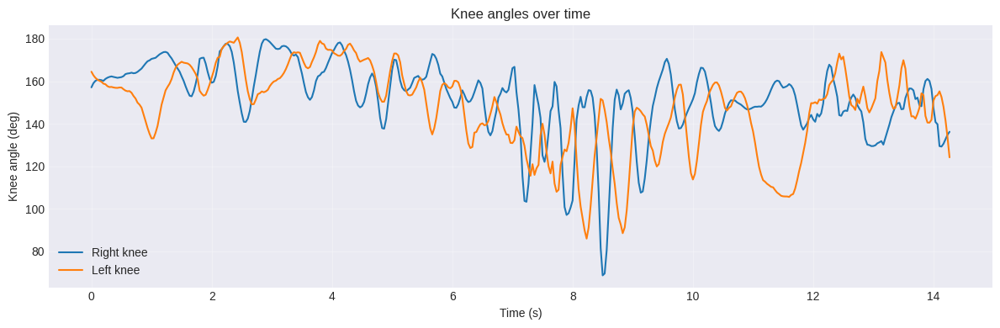

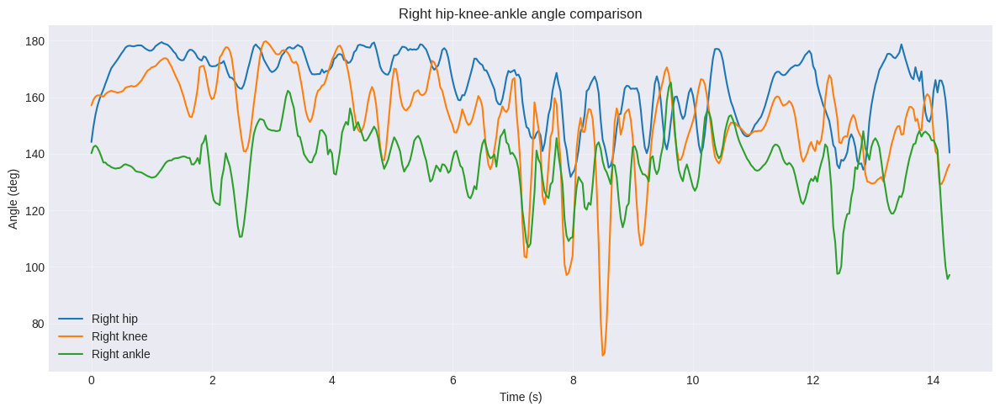

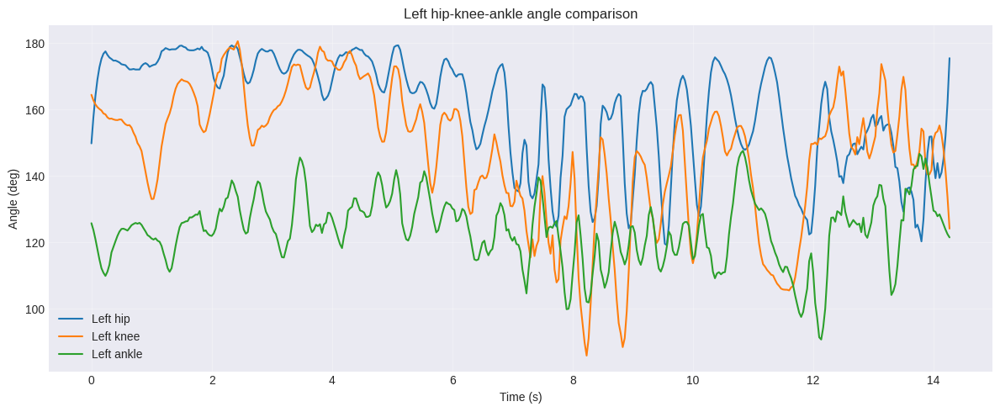

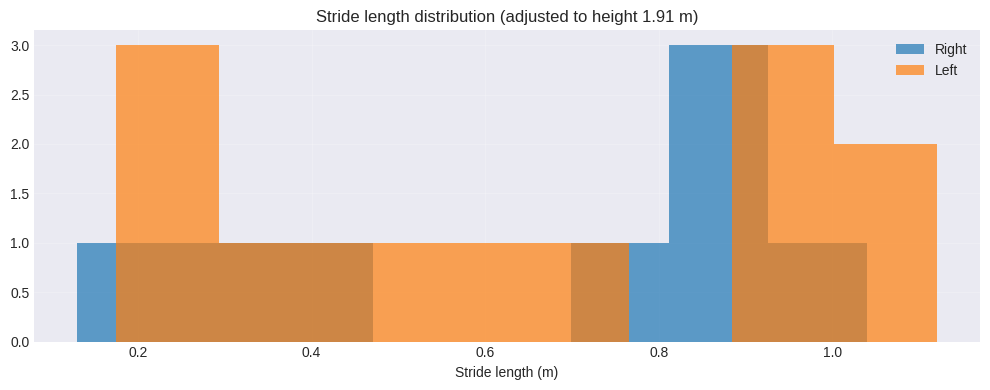

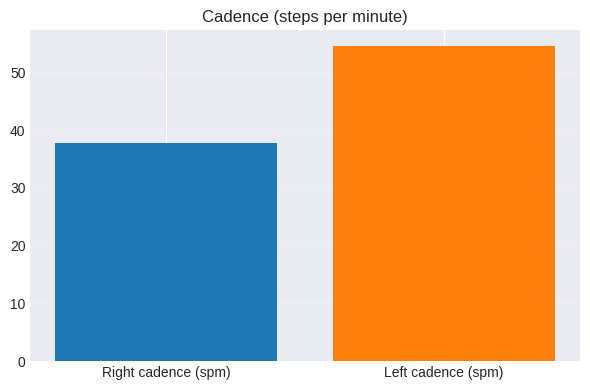

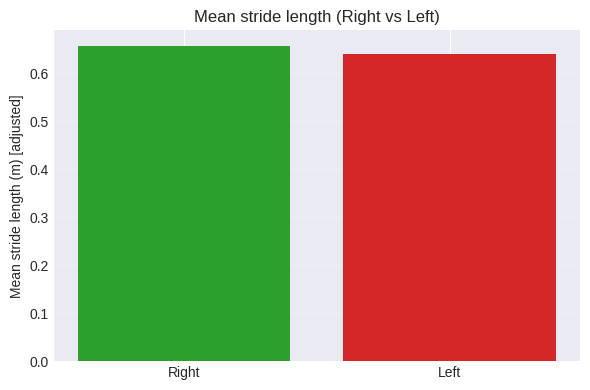


Gait speed (old): -0.0131658241647761 m/s
Gait speed (adjusted to 1.91 m): -0.0128 m/s


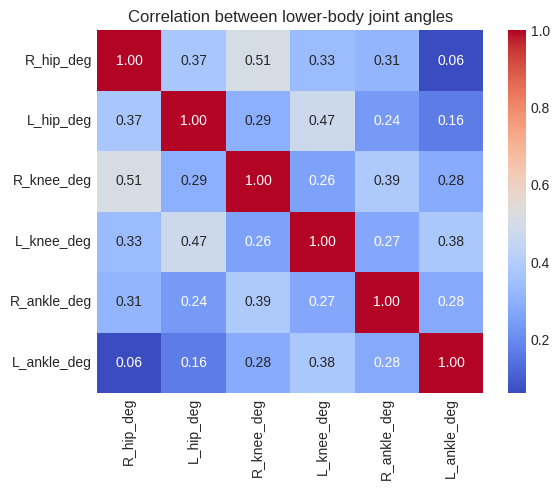

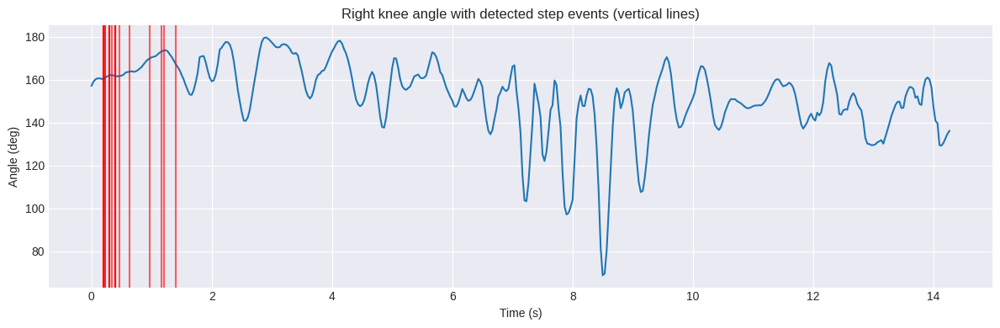


Annotated video (playable below):



=== Adjusted Summary Metrics (using height = 1.91 m) ===
Right mean stride (adj): 0.657 m
Left mean stride (adj):  0.641 m
Right cadence:           37.8 spm
Left cadence:            54.5 spm
Gait speed (adj):        -0.0128 m/s

Interpretation & coaching suggestions:
- Stride asymmetry: 2.4% (difference between sides).
  -> Stride symmetry is within acceptable range (<10%).
- Cadence observed: R 37.8 spm, L 54.5 spm.
  -> Sprint approach cadence typically much higher (e.g., 160-200 spm for maximal sprint).
- Knee & hip angle plots show sequencing; look for: (1) increasing hip extension prior to plant, (2) sufficient knee flexion during loading, (3) rapid knee extension during block.
- Gait speed is an approximate estimate (camera calibration heuristic). Use runway markers for better accuracy.

Files saved in: results


In [11]:
# Visualization + interpretation cell
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Video, display
import os

RESULTS_DIR = "results"
ANGLES_CSV = os.path.join(RESULTS_DIR, "angles_and_keypoints.csv")
STRIDES_CSV = os.path.join(RESULTS_DIR, "strides.csv")
SUMMARY_CSV = os.path.join(RESULTS_DIR, "summary_metrics.csv")
ANNOTATED_VIDEO = os.path.join(RESULTS_DIR, "annotated_video.mp4")
NEW_HEIGHT_M = 1.91          # <- your supplied height
ORIG_ASSUMED_HEIGHT_M = 1.85 # <- what was used earlier when running the notebook (based on your runs)

# ---------- Load data ----------
angles_df = pd.read_csv(ANGLES_CSV)
strides_df = pd.read_csv(STRIDES_CSV) if os.path.exists(STRIDES_CSV) else pd.DataFrame()
summary_df = pd.read_csv(SUMMARY_CSV) if os.path.exists(SUMMARY_CSV) else pd.DataFrame()

# show basic info
print("Loaded files:")
print(" - angles:", ANGLES_CSV, "rows:", len(angles_df))
print(" - strides:", STRIDES_CSV, "rows:", len(strides_df))
print(" - summary:", SUMMARY_CSV, "rows:", len(summary_df))
print()

# ---------- Calibration adjustment ----------
# If strides were computed using a previous assumed height, scale them.
# stride_m_new = stride_m_old * (ORIG_ASSUMED_HEIGHT_M / NEW_HEIGHT_M)
scale_factor = ORIG_ASSUMED_HEIGHT_M / NEW_HEIGHT_M
print(f"[INFO] scaling factor (old_height {ORIG_ASSUMED_HEIGHT_M}m -> new {NEW_HEIGHT_M}m): {scale_factor:.6f}")

if not strides_df.empty and "stride_m" in strides_df.columns:
    strides_df = strides_df.copy()
    strides_df["stride_m_orig"] = strides_df["stride_m"]
    strides_df["stride_m"] = strides_df["stride_m_orig"] * scale_factor

# adjust summary if present
if not summary_df.empty:
    summary = summary_df.iloc[0].to_dict()
    # try adjusting mean stride metrics if present
    for k in ["R_mean_stride_m", "L_mean_stride_m", "gait_speed_m_s"]:
        if k in summary and not np.isnan(summary[k]):
            # stride scales inversely with pixels_per_meter which scales with assumed height; apply factor
            summary[f"{k}_adj"] = float(summary[k] * scale_factor)
    # cadence unaffected
else:
    summary = {}

# ---------- Time series joint-angle plots ----------
time_col = None
if "time_s" in angles_df.columns:
    time_col = angles_df["time_s"]
else:
    # create frame index times from row index and try to read fps from summary
    fps = float(summary.get("fps", 30.0)) if summary else 30.0
    time_col = angles_df.index / fps

# Select angle columns (robust selection even if names vary)
def find_col(df, patterns):
    for p in patterns:
        for c in df.columns:
            if p.lower() in c.lower():
                return c
    return None

R_knee_col = find_col(angles_df, ["r_knee", "r_knee_deg", "right_knee"])
L_knee_col = find_col(angles_df, ["l_knee", "l_knee_deg", "left_knee"])
R_hip_col  = find_col(angles_df, ["r_hip", "r_hip_deg", "right_hip"])
L_hip_col  = find_col(angles_df, ["l_hip", "l_hip_deg", "left_hip"])
R_ank_col  = find_col(angles_df, ["r_ankle", "r_ankle_deg", "right_ankle"])
L_ank_col  = find_col(angles_df, ["l_ankle", "l_ankle_deg", "left_ankle"])

# Plot knee angles
plt.figure(figsize=(12,4))
if R_knee_col is not None:
    plt.plot(time_col, angles_df[R_knee_col], label="Right knee")
if L_knee_col is not None:
    plt.plot(time_col, angles_df[L_knee_col], label="Left knee")
plt.xlabel("Time (s)")
plt.ylabel("Knee angle (deg)")
plt.title("Knee angles over time")
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.savefig(os.path.join(RESULTS_DIR, "plots_knee_angles.png"), dpi=200)
plt.show()

# Plot hip/knee/ankle comparison (right side)
plt.figure(figsize=(12,5))
if R_hip_col: plt.plot(time_col, angles_df[R_hip_col], label="Right hip")
if R_knee_col: plt.plot(time_col, angles_df[R_knee_col], label="Right knee")
if R_ank_col: plt.plot(time_col, angles_df[R_ank_col], label="Right ankle")
plt.xlabel("Time (s)"); plt.ylabel("Angle (deg)")
plt.title("Right hip-knee-ankle angle comparison")
plt.legend(); plt.grid(alpha=0.3)
plt.tight_layout()
plt.savefig(os.path.join(RESULTS_DIR, "plots_right_chain.png"), dpi=200)
plt.show()

# Left side comparison
plt.figure(figsize=(12,5))
if L_hip_col: plt.plot(time_col, angles_df[L_hip_col], label="Left hip")
if L_knee_col: plt.plot(time_col, angles_df[L_knee_col], label="Left knee")
if L_ank_col: plt.plot(time_col, angles_df[L_ank_col], label="Left ankle")
plt.xlabel("Time (s)"); plt.ylabel("Angle (deg)")
plt.title("Left hip-knee-ankle angle comparison")
plt.legend(); plt.grid(alpha=0.3)
plt.tight_layout()
plt.savefig(os.path.join(RESULTS_DIR, "plots_left_chain.png"), dpi=200)
plt.show()

# ---------- Stride histograms ----------
if not strides_df.empty:
    plt.figure(figsize=(10,4))
    plt.hist(strides_df[strides_df.side=="R"].stride_m.dropna(), bins=8, alpha=0.7, label="Right")
    plt.hist(strides_df[strides_df.side=="L"].stride_m.dropna(), bins=8, alpha=0.7, label="Left")
    plt.xlabel("Stride length (m)")
    plt.title("Stride length distribution (adjusted to height {:.2f} m)".format(NEW_HEIGHT_M))
    plt.legend(); plt.grid(alpha=0.2)
    plt.tight_layout()
    plt.savefig(os.path.join(RESULTS_DIR, "plots_stride_hist.png"), dpi=200)
    plt.show()
else:
    print("[WARN] No strides.csv found — skipping stride histogram.")

# ---------- Cadence bar plot ----------
if "R_n_steps" in summary or "L_n_steps" in summary:
    r_steps = int(summary.get("R_n_steps", 0))
    l_steps = int(summary.get("L_n_steps", 0))
    R_cad = float(summary.get("R_cadence_spm", np.nan))
    L_cad = float(summary.get("L_cadence_spm", np.nan))
    plt.figure(figsize=(6,4))
    plt.bar(["Right cadence (spm)","Left cadence (spm)"], [R_cad, L_cad], color=["#1f77b4","#ff7f0e"])
    plt.title("Cadence (steps per minute)")
    plt.grid(axis="y", alpha=0.2)
    plt.tight_layout()
    plt.savefig(os.path.join(RESULTS_DIR, "plots_cadence.png"), dpi=200)
    plt.show()
else:
    print("[WARN] Cadence fields not found in summary — skipping cadence plot.")

# ---------- Asymmetry plot (mean stride left vs right) ----------
if ("R_mean_stride_m" in summary) and ("L_mean_stride_m" in summary):
    R_mean_old = summary.get("R_mean_stride_m", np.nan)
    L_mean_old = summary.get("L_mean_stride_m", np.nan)
    R_mean_adj = summary.get("R_mean_stride_m_adj", np.nan)
    L_mean_adj = summary.get("L_mean_stride_m_adj", np.nan)
    plt.figure(figsize=(6,4))
    plt.bar(["Right","Left"], [R_mean_adj, L_mean_adj], color=["#2ca02c","#d62728"])
    plt.ylabel("Mean stride length (m) [adjusted]")
    plt.title("Mean stride length (Right vs Left)")
    plt.grid(axis="y", alpha=0.2)
    plt.tight_layout()
    plt.savefig(os.path.join(RESULTS_DIR, "plots_stride_asymmetry.png"), dpi=200)
    plt.show()
else:
    print("[WARN] Mean stride values not found in summary — skipping asymmetry plot.")

# ---------- Gait speed / forward velocity summary ----------
gait_speed_old = summary.get("gait_speed_m_s", np.nan)
gait_speed_adj = summary.get("gait_speed_m_s_adj", np.nan)
print("\nGait speed (old):", gait_speed_old, "m/s")
print("Gait speed (adjusted to {:.2f} m): {:.4f} m/s".format(NEW_HEIGHT_M, gait_speed_adj if not np.isnan(gait_speed_adj) else np.nan))

# ---------- Correlation heatmap between joint angles (stability indicator) ----------
import seaborn as sns
angle_cols = [c for c in angles_df.columns if any(k in c.lower() for k in ["hip","knee","ankle"])]
if len(angle_cols) >= 2:
    corr = angles_df[angle_cols].corr()
    plt.figure(figsize=(6,5))
    sns.heatmap(corr, annot=True, cmap="coolwarm", fmt=".2f")
    plt.title("Correlation between lower-body joint angles")
    plt.tight_layout()
    plt.savefig(os.path.join(RESULTS_DIR, "plots_joint_corr.png"), dpi=200)
    plt.show()
else:
    print("[WARN] Not enough angle columns for correlation heatmap.")

# ---------- Step overlay on knee angle (if peaks exist in strides_df) ----------
# If strides_df contains indices as 'step_frame' or 'frame' we can overlay; attempt robustly
step_frames = []
if not strides_df.empty:
    # if there's a column frame/index for each stride, use it; otherwise compute approximate frames from step times if available
    if "frame" in strides_df.columns:
        step_frames = strides_df["frame"].dropna().astype(int).tolist()
    elif "step_time_s" in strides_df.columns:
        # convert times to frames using summary fps
        fps = float(summary.get("fps", 30.0)) if summary else 30.0
        step_frames = (strides_df["step_time_s"].dropna() * fps).astype(int).tolist()

if step_frames and R_knee_col:
    plt.figure(figsize=(12,4))
    plt.plot(time_col, angles_df[R_knee_col], label="R_knee")
    for sf in step_frames:
        if sf < len(time_col):
            plt.axvline(time_col.iloc[sf], color="red", alpha=0.6)
    plt.title("Right knee angle with detected step events (vertical lines)")
    plt.xlabel("Time (s)"); plt.ylabel("Angle (deg)")
    plt.tight_layout()
    plt.savefig(os.path.join(RESULTS_DIR, "plots_knee_steps.png"), dpi=200)
    plt.show()
else:
    print("[INFO] No step frame indices available to overlay on knee angle.")

# ---------- Show annotated video ----------
if os.path.exists(ANNOTATED_VIDEO):
    print("\nAnnotated video (playable below):")
    display(Video(ANNOTATED_VIDEO, embed=True, width=700))
else:
    print("[WARN] annotated_video.mp4 not found.")

# ---------- Print a human-readable summary & coaching suggestions ----------
print("\n=== Adjusted Summary Metrics (using height = {:.2f} m) ===".format(NEW_HEIGHT_M))
if summary:
    print(f"Right mean stride (adj): {summary.get('R_mean_stride_m_adj', np.nan):.3f} m")
    print(f"Left mean stride (adj):  {summary.get('L_mean_stride_m_adj', np.nan):.3f} m")
    print(f"Right cadence:           {summary.get('R_cadence_spm', np.nan):.1f} spm")
    print(f"Left cadence:            {summary.get('L_cadence_spm', np.nan):.1f} spm")
    print(f"Gait speed (adj):        {summary.get('gait_speed_m_s_adj', np.nan):.4f} m/s")
else:
    print("No summary data available to display adjusted metrics.")

print("\nInterpretation & coaching suggestions:")
# quick numeric checks
R_mean = summary.get('R_mean_stride_m_adj', np.nan)
L_mean = summary.get('L_mean_stride_m_adj', np.nan)
if not np.isnan(R_mean) and not np.isnan(L_mean):
    asym_pct = (abs(R_mean - L_mean) / max(R_mean, L_mean)) * 100
    print(f"- Stride asymmetry: {asym_pct:.1f}% (difference between sides).")
    if asym_pct > 10:
        print("  -> Asymmetry >10%: consider technique balance drills and check for weaker side compensation.")
    else:
        print("  -> Stride symmetry is within acceptable range (<10%).")
# cadence guidance
R_cad = summary.get("R_cadence_spm", np.nan)
L_cad = summary.get("L_cadence_spm", np.nan)
if not np.isnan(R_cad) or not np.isnan(L_cad):
    print(f"- Cadence observed: R {R_cad:.1f} spm, L {L_cad:.1f} spm.")
    print("  -> Sprint approach cadence typically much higher (e.g., 160-200 spm for maximal sprint).")
# knee angle notes
print("- Knee & hip angle plots show sequencing; look for: (1) increasing hip extension prior to plant, (2) sufficient knee flexion during loading, (3) rapid knee extension during block.")
print("- Gait speed is an approximate estimate (camera calibration heuristic). Use runway markers for better accuracy.")
print("\nFiles saved in:", RESULTS_DIR)


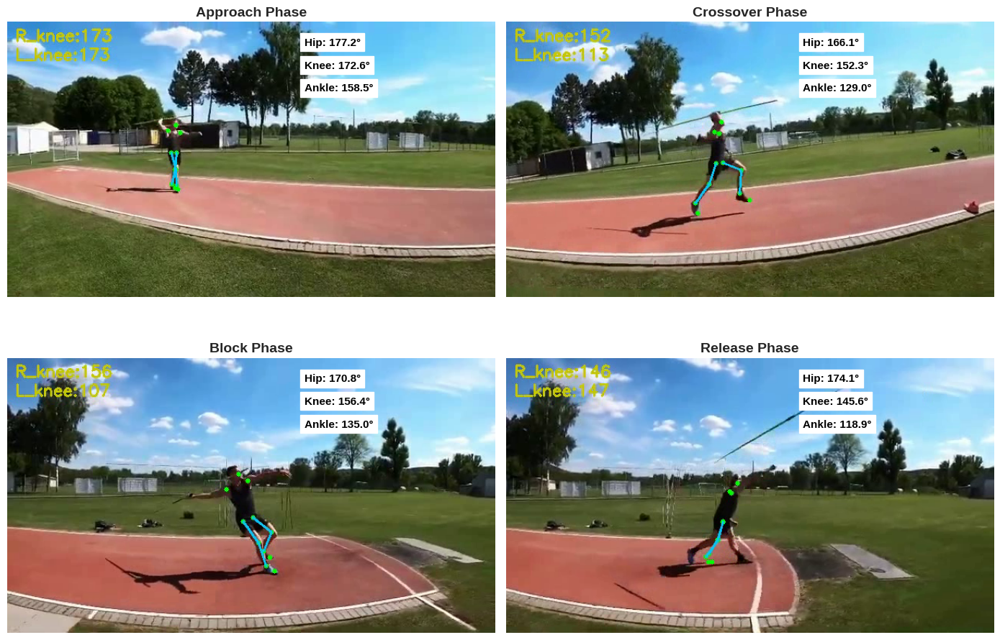

In [15]:
import cv2
import pandas as pd
import matplotlib.pyplot as plt

# Load files
video_path = "results/annotated_video.mp4"
data = pd.read_csv("results/angles_and_keypoints.csv")

# Define phases + representative frame numbers
phases = {
    "Approach Phase\n(Building speed)": 100,
    "Crossover Phase\n(Speed → Torque)": 250,
    "Block Phase\n(Energy Transfer)": 350,
    "Release Phase\n(Final Mechanics)": 400
}

plt.figure(figsize=(14, 10))
cap = cv2.VideoCapture(video_path)

for i, (phase, frame_num) in enumerate(phases.items(), start=1):
    
    # Read frame
    cap.set(cv2.CAP_PROP_POS_FRAMES, frame_num)
    ret, frame = cap.read()
    
    if frame is None:
        continue
    
    row = data.iloc[frame_num]

    hip = row["R_hip_deg"]
    knee = row["R_knee_deg"]
    ankle = row["R_ankle_deg"]
    
    # Convert for display
    frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

    # Show subplot
    ax = plt.subplot(2, 2, i)
    ax.imshow(frame_rgb)
    ax.set_title(phase.split('\n')[0], fontsize=14, fontweight="bold")
    ax.axis("off")
    
    # Text placement (top-right)
    h, w, _ = frame_rgb.shape
    x = w - 250  # shift text to right side
    
    plt.text(x, 30, f"Hip: {hip:.1f}°", fontsize=11,
             fontweight="bold", color="black", backgroundcolor="white")
    plt.text(x, 60, f"Knee: {knee:.1f}°", fontsize=11,
             fontweight="bold", color="black", backgroundcolor="white")
    plt.text(x, 90, f"Ankle: {ankle:.1f}°", fontsize=11,
             fontweight="bold", color="black", backgroundcolor="white")

plt.tight_layout()
plt.show()
cap.release()
